<center><h1>Notebook Analyse Dataset NIH Chest X-rays</h1></center>
<center><h3>Tiffany Gay-Bellile</h3></center>
<center><h3>Sarah Chaabouni</h3></center>

## 1. Chargement et aperçu des données

Dans cette première étape, nous chargeons le fichier contenant les métadonnées du dataset NIH Chest X-rays.  
Nous explorons ensuite les premières lignes pour comprendre la structure des colonnes, vérifier les doublons et repérer d’éventuelles valeurs manquantes ou aberrantes.


In [1]:
import pandas as pd

#  Chargement des données
data = pd.read_csv("/kaggle/input/data/Data_Entry_2017.csv")

#  Aperçu des premières lignes
display(data.head())

# Dimensions du tableau
print("Nombre de lignes (images) :", data.shape[0])
print("Nombre de colonnes :", data.shape[1])

# Liste des colonnes
print("\nColonnes disponibles :")
print(data.columns.tolist())

# Types de données
print("\nTypes de données :")
print(data.dtypes)

# Valeurs manquantes
print("\nValeurs manquantes par colonne :")
print(data.isnull().sum())

# Vérification des doublons
print("\nNombre de doublons :", data.duplicated().sum())


/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,0.143,NaN
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143,NaN
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168,NaN
3,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,0.171,NaN
4,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,0.143,NaN


Nombre de lignes (images) : 112120
Nombre de colonnes : 12

Colonnes disponibles :
['Image Index', 'Finding Labels', 'Follow-up #', 'Patient ID', 'Patient Age', 'Patient Gender', 'View Position', 'OriginalImage[Width', 'Height]', 'OriginalImagePixelSpacing[x', 'y]', 'Unnamed: 11']

Types de données :
Image Index                     object
Finding Labels                  object
Follow-up #                      int64
Patient ID                       int64
Patient Age                      int64
Patient Gender                  object
View Position                   object
OriginalImage[Width              int64
Height]                          int64
OriginalImagePixelSpacing[x    float64
y]                             float64
Unnamed: 11                    float64
dtype: object

Valeurs manquantes par colonne :
Image Index                         0
Finding Labels                      0
Follow-up #                         0
Patient ID                          0
Patient Age                   

##  Analyse initiale des données

###  Dimensions :
- Nombre total d’images : **112 120**
- Nombre de colonnes : **12**

###  Colonnes principales :
- `Image Index` : nom de fichier image (.png)
- `Finding Labels` : pathologies observées (séparées par `|` si multiples)
- `Follow-up #` : numéro de suivi pour un même patient
- `Patient ID`, `Patient Age`, `Patient Gender`
- `View Position` : position de prise de vue (`PA` ou `AP`)
- `OriginalImage[Width`, `Height]` : dimensions brutes de l’image
- `OriginalImagePixelSpacing[x`, `y]` : taille réelle d’un pixel (en mm)

###  Nettoyage à prévoir :
- La colonne `Unnamed: 11` est vide (100 % de valeurs manquantes) → à supprimer.
- Les noms de colonnes comme `'OriginalImage[Width'` ou `'Height]'` sont mal parsés → à renommer proprement.
- Quelques valeurs très petites ou très grandes ont provoqué un `RuntimeWarning` dans Pandas → probablement à cause de valeurs aberrantes ou `NaN`.

###  Pas de doublons détectés
Le dataset ne contient **aucune ligne strictement dupliquée**.



In [2]:
#  Suppression de la colonne complètement vide
data.drop(columns=['Unnamed: 11'], inplace=True)

In [3]:
#  Renommage propre des colonnes avec crochets mal fermés
data.rename(columns={
    'OriginalImage[Width': 'Image Width',
    'Height]': 'Image Height',
    'OriginalImagePixelSpacing[x': 'PixelSpacing X',
    'y]': 'PixelSpacing Y'
}, inplace=True)

#  Vérification des nouveaux noms
print("Colonnes après renommage :")
print(data.columns.tolist())

# Nettoyage des âges aberrants
print("Âges avant nettoyage :")
print(data['Patient Age'].describe())

#  Aperçu après nettoyage
print("\nDataset après nettoyage :")
print(data.shape)
display(data.head())


Colonnes après renommage :
['Image Index', 'Finding Labels', 'Follow-up #', 'Patient ID', 'Patient Age', 'Patient Gender', 'View Position', 'Image Width', 'Image Height', 'PixelSpacing X', 'PixelSpacing Y']
Âges avant nettoyage :
count    112120.000000
mean         46.901463
std          16.839923
min           1.000000
25%          35.000000
50%          49.000000
75%          59.000000
max         414.000000
Name: Patient Age, dtype: float64

Dataset après nettoyage :
(112120, 11)


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,Image Width,Image Height,PixelSpacing X,PixelSpacing Y
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,0.143
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168
3,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,0.171
4,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,0.143


## 3. Encodage des pathologies (multi-label → binaire)

La colonne `Finding Labels` contient une ou plusieurs pathologies séparées par un `|`.  
Nous allons transformer cette colonne en une série de colonnes binaires, une pour chaque pathologie, contenant 1 si elle est présente sur l'image, 0 sinon.

Cela permettra ensuite d’analyser la fréquence des pathologies, leurs co-occurrences, ou de construire des modèles de classification multi-label.


In [4]:
# Extraction de toutes les pathologies uniques
all_labels = set()
data['Finding Labels'].str.split('|').apply(all_labels.update)

# 🔧 Création d’une colonne binaire pour chaque pathologie
for label in all_labels:
    data[label] = data['Finding Labels'].apply(lambda x: 1 if label in x else 0)

#  Vérification
print("Colonnes binaires créées :", list(all_labels))
display(data[list(all_labels)].head())


Colonnes binaires créées : ['Fibrosis', 'Cardiomegaly', 'Pleural_Thickening', 'Pneumonia', 'Mass', 'Nodule', 'Edema', 'Atelectasis', 'Hernia', 'Consolidation', 'Infiltration', 'Effusion', 'Emphysema', 'No Finding', 'Pneumothorax']


,Fibrosis,Cardiomegaly,Pleural_Thickening,Pneumonia,Mass,Nodule,Edema,Atelectasis,Hernia,Consolidation,Infiltration,Effusion,Emphysema,No Finding,Pneumothorax
0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
2,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [5]:
# Exclure "No Finding" si tu ne veux pas le compter comme pathologie réelle
labels_sans_no_finding = [col for col in all_labels if col != "No Finding"]

# Ajouter une colonne avec le nombre de pathologies par image
data["Num Pathologies"] = data[labels_sans_no_finding].sum(axis=1)

data["Num Pathologies"]

0         1
1         2
2         2
3         0
4         1
         ..
112115    2
112116    0
112117    0
112118    0
112119    0
Name: Num Pathologies, Length: 112120, dtype: int64

## 4. Analyse descriptive des pathologies

Cette section a pour but d’explorer la fréquence des différentes pathologies détectées dans les radiographies thoraciques.

Nous allons notamment :
- compter le nombre d’images associées à chaque pathologie,
- visualiser les cas multi-pathologiques (images avec plusieurs étiquettes),
- représenter graphiquement la répartition des maladies.


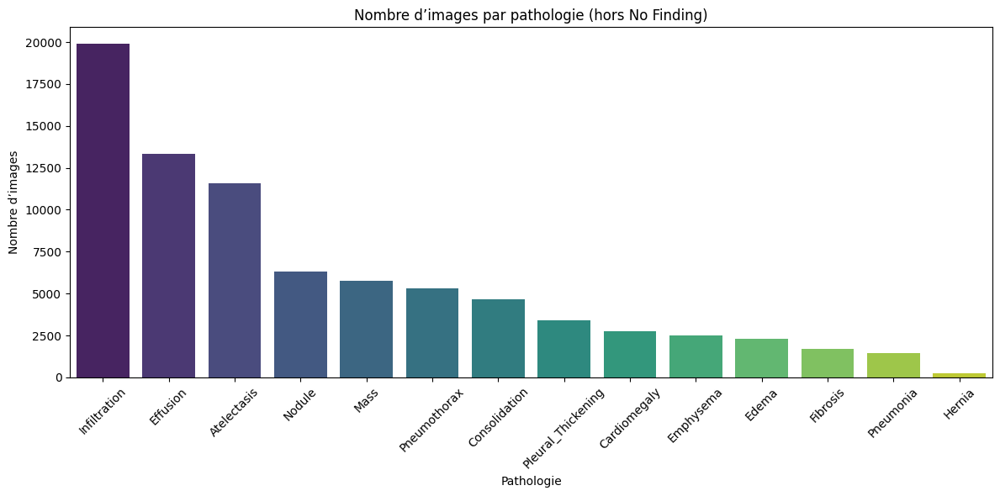

<ipython-input-6-cdb2ca252a31>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_malades['Num Pathologies'] = df_malades[labels_sans_no_finding].sum(axis=1)
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


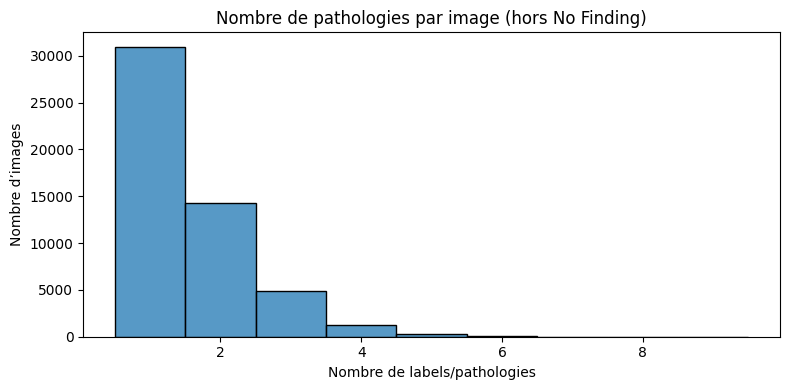

 40.18% des images (hors No Finding) ont plusieurs pathologies.


In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

# Liste des pathologies sans "No Finding"
labels_sans_no_finding = [label for label in all_labels if label != 'No Finding']

# Nombre d’images par pathologie (hors No Finding)
patho_counts = data[labels_sans_no_finding].sum().sort_values(ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x=patho_counts.index, y=patho_counts.values, palette='viridis')
plt.title("Nombre d’images par pathologie (hors No Finding)")
plt.ylabel("Nombre d’images")
plt.xlabel("Pathologie")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Liste des colonnes pathologies sans "No Finding"
labels_sans_no_finding = [label for label in all_labels if label != 'No Finding']

# Filtrage : on ne garde que les images avec AU MOINS une pathologie réelle
df_malades = data[data[labels_sans_no_finding].sum(axis=1) > 0]

# Recalcul du nombre de pathologies réelles par image
df_malades['Num Pathologies'] = df_malades[labels_sans_no_finding].sum(axis=1)

# Histogramme du nombre de pathologies
plt.figure(figsize=(8, 4))
sns.histplot(df_malades['Num Pathologies'], bins=range(1, df_malades['Num Pathologies'].max()+2), discrete=True)
plt.title("Nombre de pathologies par image (hors No Finding)")
plt.xlabel("Nombre de labels/pathologies")
plt.ylabel("Nombre d’images")
plt.tight_layout()
plt.show()

# Pourcentage d’images multi-pathologies
multi_label_rate = (df_malades['Num Pathologies'] > 1).mean() * 100
print(f" {multi_label_rate:.2f}% des images (hors No Finding) ont plusieurs pathologies.")


### Analyse des pathologies détectées (hors "No Finding")

### Répartition des pathologies sur les images :
Ce graphique présente le nombre d’images annotées avec chaque pathologie, en excluant les cas normaux ("No Finding").

#### Observations :
- **Infiltration** est la pathologie la plus fréquente avec près de **20 000 images**.
- Viennent ensuite :
  - **Effusion** (~13 000 images)
  - **Atelectasis** (~11 500 images)
- Les pathologies les plus rares sont :
  - **Pneumonia**, **Fibrosis**, et surtout **Hernia**, qui est très peu représentée.

 Ces déséquilibres entre classes doivent être pris en compte dans tout modèle d’apprentissage, sous peine de biais vers les pathologies majoritaires.

---

### Nombre de pathologies par image :
Le second graphique montre la répartition du nombre de pathologies par image (hors No Finding).

#### Observations :
- La majorité des images présentent **1 seule pathologie**.
- Cependant, environ **40,18 % des images annotées présentent plusieurs pathologies simultanées**.
- Certaines images cumulent jusqu’à **6 ou 7 pathologies**, ce qui illustre la **complexité clinique** de certains cas (ex. : patient en détresse respiratoire, comorbidités...).

Cela confirme que le problème est bien un **cas de classification multi-label**, et non un simple classement mono-pathologie.

---

### Conclusion :
- L’exclusion des cas "No Finding" permet une meilleure compréhension de la distribution réelle des maladies.
- La forte proportion de cas multi-étiquetés justifie des approches adaptées (ex : modèles multi-sortie, seuils personnalisés, etc.).


## Analyse des relations entre pathologies

Dans cette section, nous analysons les liens entre les différentes pathologies observées chez les patients.  
Pour cela, nous utilisons deux approches complémentaires :

---

### 1.  Matrice de corrélation (Pearson)

Cette matrice évalue la **corrélation statistique** entre les pathologies à travers tous les patients.  
Chaque valeur mesure à quel point deux pathologies **varient ensemble** (présentes ou absentes) dans le dataset.

- Elle est **symétrique** : Corr(A, B) = Corr(B, A)
- Elle reflète une **relation globale** entre pathologies.
- Elle est utile pour des **analyses multivariées**, des modèles statistiques ou du clustering.

---

### 2. Matrice de co-occurrence conditionnelle (%)

Cette matrice indique, pour chaque pathologie, **le pourcentage de patients** qui présentent également une autre pathologie.

- Elle est **asymétrique** : on lit la matrice ligne par ligne.
- Elle répond à la question clinique :  
  → *"Parmi les patients ayant la pathologie A, combien ont aussi B ?"*
- Elle est **plus parlante cliniquement** car elle décrit directement les **profils de co-morbidité des patients**.



En combinant ces deux grilles de lecture, nous obtenons une **vue complète des relations entre pathologies**, à la fois mathématique et médicale.


In [7]:
# Agrégation par patient : 1 si au moins une image présente la pathologie
data_patient = data.groupby('Patient ID').agg({
    'Patient Age': 'first',
    'Patient Gender': 'first',
    **{label: 'max' for label in labels_sans_no_finding}
}).reset_index()


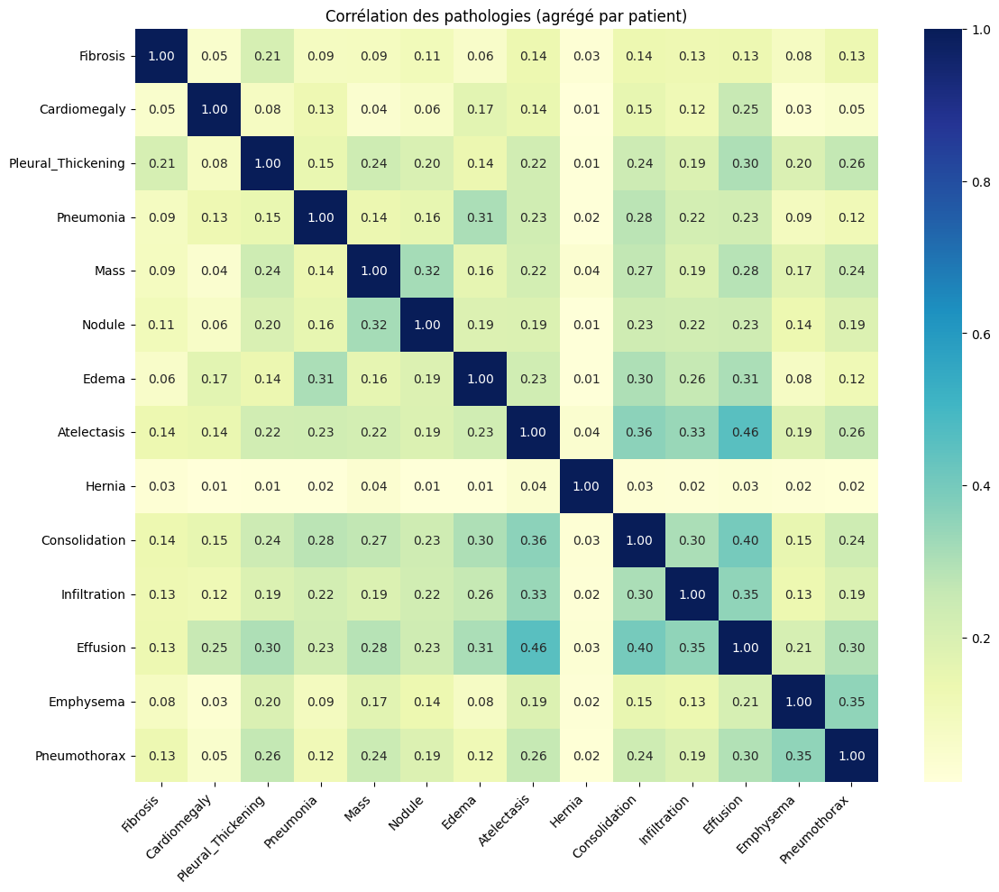

In [8]:
# Corrélation entre pathologies (par patient cette fois)
correlation_patient = data_patient[labels_sans_no_finding].corr()

# Heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_patient, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("Corrélation des pathologies (agrégé par patient)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


##  Analyse de la corrélation entre pathologies (Pearson)

La matrice suivante présente la **corrélation de Pearson** entre chaque paire de pathologies, calculée à l’échelle des patients.  
Elle mesure à quel point deux pathologies **varient ensemble** dans le dataset. Une valeur proche de 1 indique une forte association, tandis qu'une valeur proche de 0 suggère peu ou pas de relation.

---

###  Observations principales :

- Les **corrélations les plus élevées** concernent :
  - **Effusion & Atelectasis : 0.46**
  - **Consolidation & Effusion : 0.40**
  - **Pneumonia & Consolidation : 0.28**
  Ces associations sont cohérentes avec des **syndromes pulmonaires complexes**, souvent présents chez les patients hospitalisés.

- En revanche, la **majorité des corrélations sont faibles**, même pour certaines pathologies pourtant liées cliniquement :

Par exemple, **Pneumonia & Edema : 0.31** ou **Infiltration & Effusion : 0.35**

---

### Pourquoi ces corrélations sont-elles faibles ?

Ce phénomène est **attendu**, et s’explique par plusieurs raisons statistiques :

 **Pearson est peu adapté aux données binaires (0/1)**  
   Il mesure la variation globale, pas uniquement la présence conjointe. Deux pathologies peuvent apparaître souvent ensemble, mais avoir une corrélation faible si elles sont **souvent absentes en même temps**.

 **Le dataset est déséquilibré**  
   Certaines pathologies sont **très rares** (comme Hernia), ce qui rend difficile la détection de liens par corrélation classique.

---

###  Pour pallier cela : co-occurrence conditionnelle (%)

Afin d’obtenir une **lecture plus clinique et intuitive**, nous allons compléter l’analyse avec une **matrice de co-occurrence conditionnelle (%)**.  
Elle indiquera, pour chaque pathologie, **le pourcentage de patients** qui présentent **simultanément une autre pathologie**.

Cela permettra d’explorer directement les **profils typiques de comorbidité** chez les patients.


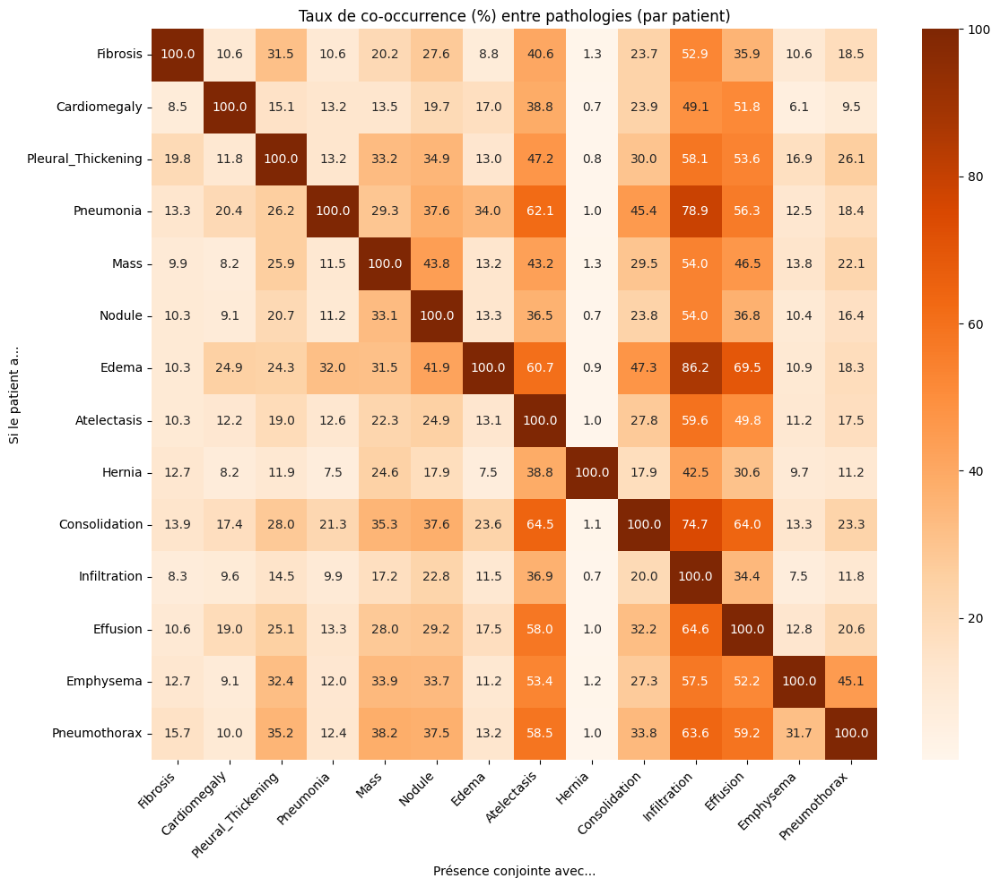

In [9]:
import numpy as np
# On part des pathologies binaires (sans No Finding)
X = data_patient[labels_sans_no_finding]

#  Matrice de co-occurrence brute
cooc_abs = X.T.dot(X)

#  On divise chaque ligne par le total de patients atteints de cette pathologie (diagonale)
cooc_conditional = cooc_abs.div(np.diag(cooc_abs), axis=0) * 100

#  Heatmap du taux conditionnel
plt.figure(figsize=(12, 10))
sns.heatmap(cooc_conditional, annot=True, fmt=".1f", cmap="Oranges")
plt.title("Taux de co-occurrence (%) entre pathologies (par patient)")
plt.xlabel("Présence conjointe avec...")
plt.ylabel("Si le patient a...")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()



##  Analyse de la heatmap de co-occurrence conditionnelle (par patient)

La heatmap présente les taux (%) de co-occurrence entre les pathologies. Chaque cellule indique la proportion de patients atteints d'une pathologie (ligne) ayant aussi la pathologie en colonne.

---

### 🔹 Regroupements pathologiques visibles :

- **Consolidation, Pneumonia, Effusion, Atelectasis** forment un **groupe fortement interconnecté** :  
  - Par exemple, **74.7 % des patients avec consolidation ont aussi une effusion**,  
  - Et **78.9 % des patients avec pneumonie** ont aussi une consolidation.  
  Cela traduit des **syndromes pulmonaires denses** liés à des infections ou à de l’insuffisance cardiaque.

- **Edema** présente aussi des co-occurrences fortes avec :
  **Effusion (69.5 %)**, **Consolidation (47.3 %)**, et **Cardiomegaly (49.1 %)**, ce qui reflète un **profil typique d’insuffisance cardiaque congestive**.

- **Mass ↔ Nodule (54.0 %)** : ces deux anomalies sont souvent associées dans le contexte d’un suivi oncologique (évolution potentielle du nodule vers une masse).

---

### 🔹 Pathologies isolées ou peu liées :

- **Hernia**, **Emphysema**, et **Fibrosis** montrent des co-occurrences plus faibles avec le reste,  
  → Cela suggère qu’elles sont souvent **observées seules**, ou dans des contextes cliniques différents.

- **Pneumothorax** se lie modérément avec **Effusion (35.2 %)** et **Infiltration (33.8 %)**,  
  → Compatible avec des contextes traumatiques ou postopératoires.

---

Cette matrice révèle des **groupes de pathologies fréquemment associées** (infections, œdèmes, collapsus pulmonaires) et d'autres plus **indépendantes**.  
Elle peut servir de **base pour regrouper certaines classes** lors de la modélisation, ou orienter une segmentation clinique automatisée.


## 4. Analyse démographique : âge et genre des patients

Cette étape vise à explorer les dimensions démographiques du dataset NIH Chest X-ray.  
Nous allons étudier :

- La distribution des patients par **âge** et **genre**,
- Les **tranches d’âge** les plus représentées,
- L’impact de l’âge et du sexe sur la **fréquence des pathologies**.

Cette analyse est particulièrement utile pour mettre en évidence des **facteurs de risque spécifiques à certaines populations** (ex. maladies plus fréquentes chez les hommes ou chez les patients âgés).


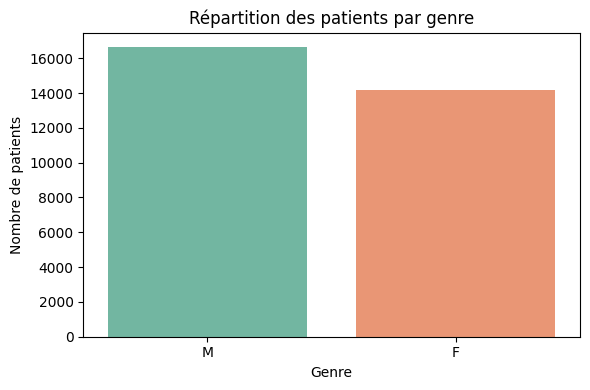

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


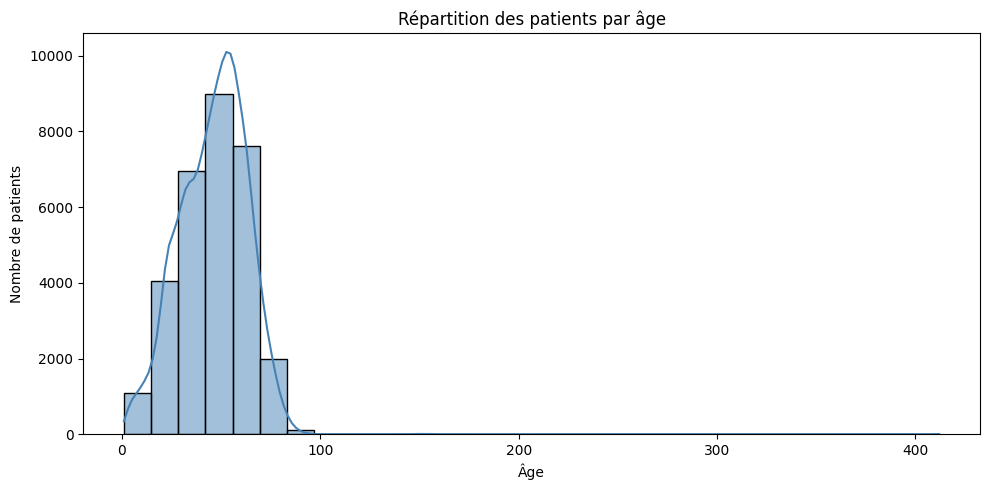

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# 📊 Répartition par genre
plt.figure(figsize=(6, 4))
sns.countplot(data=data_patient, x='Patient Gender', palette='Set2')
plt.title("Répartition des patients par genre")
plt.xlabel("Genre")
plt.ylabel("Nombre de patients")
plt.tight_layout()
plt.show()

# 📊 Répartition par âge
plt.figure(figsize=(10, 5))
sns.histplot(data_patient['Patient Age'], bins=30, kde=True, color="steelblue")
plt.title("Répartition des patients par âge")
plt.xlabel("Âge")
plt.ylabel("Nombre de patients")
plt.tight_layout()
plt.show()


##  Répartition démographique des patients

### Par genre :
Le premier graphique montre que le dataset est composé de :
- Une majorité de patients de sexe **masculin** (~54 %),
- Une proportion légèrement inférieure de patients de sexe **féminin** (~46 %).

 La distribution est **relativement équilibrée**, ce qui permet des comparaisons entre genres sans trop de biais d’effectif.

---

### Par âge :
Le second graphique présente la répartition des patients en fonction de leur âge.

- La majorité des patients ont entre **30 et 70 ans**.
- Le pic se situe autour de **60 ans**, ce qui est cohérent avec les pathologies thoraciques fréquentes chez les adultes plus âgés (ex : effusion, cardiomégalie...).
- Très peu de patients ont moins de 20 ans ou plus de 90 ans.

---

Nous allons maintenant regrouper les âges en **tranches d’âge**, afin d’étudier l’influence de l’âge sur la fréquence des différentes pathologies.


In [11]:
# Création de tranches d'âge personnalisées
bins = [0, 20, 40, 60, 80, 100]
labels = ["0-20", "21-40", "41-60", "61-80", "81-100"]

data_patient['Age Group'] = pd.cut(data_patient['Patient Age'], bins=bins, labels=labels, right=True)

data_patient['Age Group'].value_counts().sort_index()


Age Group
0-20       2180
21-40      8831
41-60     13463
61-80      6063
81-100      260
Name: count, dtype: int64

<ipython-input-12-00637623da77>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  age_group_stats = data_patient.groupby('Age Group')[labels_sans_no_finding].mean() * 100


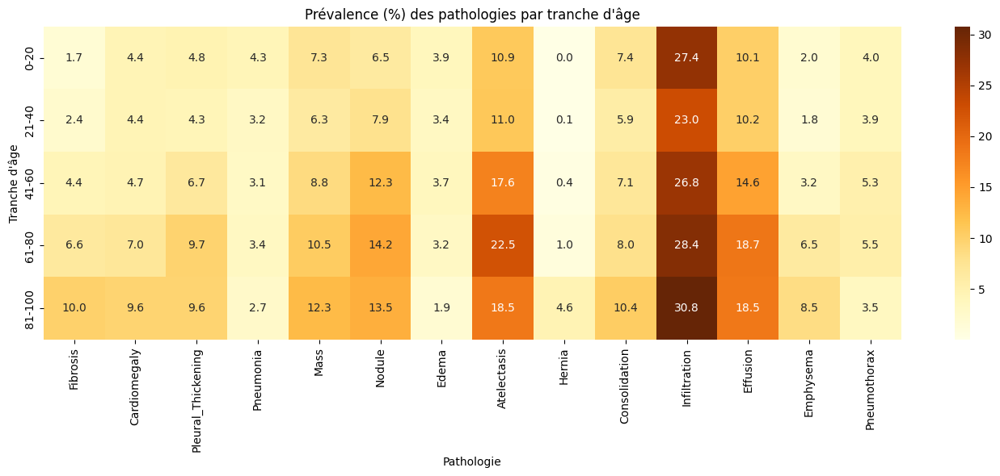

In [12]:
# Calcul : % de patients atteints d’une pathologie pour chaque tranche d’âge
age_group_stats = data_patient.groupby('Age Group')[labels_sans_no_finding].mean() * 100

# Heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(age_group_stats, annot=True, fmt=".1f", cmap="YlOrBr")
plt.title("Prévalence (%) des pathologies par tranche d'âge")
plt.xlabel("Pathologie")
plt.ylabel("Tranche d'âge")
plt.tight_layout()
plt.show()


La heatmap ci-dessus montre la **proportion (%) de patients atteints** par chaque pathologie, selon leur tranche d’âge.

Chaque cellule représente le pourcentage de patients de la tranche concernée qui présentent cette pathologie.

---

### Observations principales :

#### Infiltration
- C’est la pathologie la plus fréquente dans toutes les tranches d’âge.
- Elle augmente avec l’âge, culminant à **30.8 % chez les patients de 81 à 100 ans**, ce qui peut refléter une fragilité pulmonaire accrue.

#### Atelectasis
- Prévalence croissante avec l’âge : **10.9 % chez les 0–20 ans**, jusqu’à **22.5 % chez les 61–80 ans**.
- Cela peut être lié à des affaissements pulmonaires post-opératoires ou à des comorbidités liées à l’âge.

#### Effusion
- Relativement stable, mais augmente à partir de 41 ans jusqu’à atteindre **18.5 % chez les patients > 80 ans**.
- Suggère une association avec des pathologies cardiaques ou inflammatoires chez les seniors.

#### Cardiomegaly & Edema
- Fréquences plus faibles chez les jeunes, mais croissance nette chez les **plus de 60 ans**.
- Très cohérent avec les **pathologies cardiovasculaires** liées au vieillissement.

#### Pneumothorax et Hernia
- Peu fréquents dans toutes les tranches.
- Hernia reste extrêmement rare dans tout le dataset (<5 %).

---


Cette visualisation montre que certaines pathologies comme **l’infiltration, l’épanchement (effusion)** ou **l’atelectasis** sont **fortement liées à l’âge**.  
Elle renforce l’idée que l’âge est un facteur de risque important dans la détection de pathologies pulmonaires visibles sur radiographie thoracique.

Nous allons maintenant étudier la **répartition des pathologies par genre**, pour voir si des différences apparaissent entre hommes et femmes.


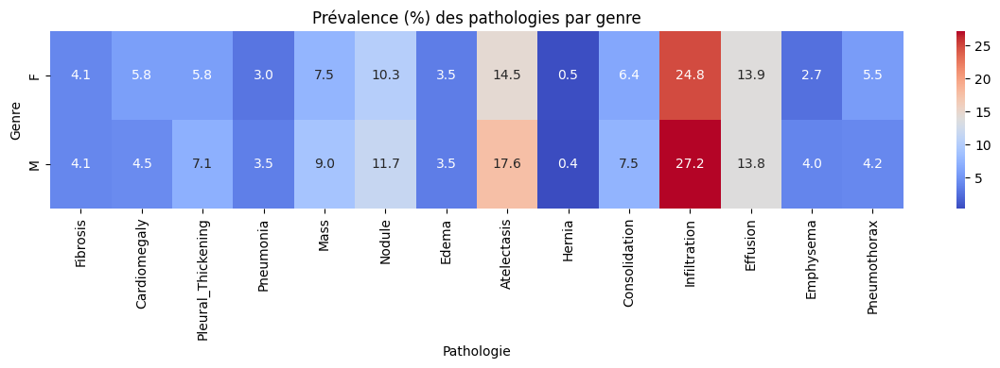

In [13]:
# Calcul : % de patients atteints pour chaque pathologie selon le genre
genre_patho_stats = data_patient.groupby('Patient Gender')[labels_sans_no_finding].mean() * 100

# Heatmap
plt.figure(figsize=(12, 4))
sns.heatmap(genre_patho_stats, annot=True, fmt=".1f", cmap="coolwarm")
plt.title("Prévalence (%) des pathologies par genre")
plt.xlabel("Pathologie")
plt.ylabel("Genre")
plt.tight_layout()
plt.show()


La heatmap ci-dessus montre la **prévalence (%) de chaque pathologie** chez les patients masculins et féminins.


### Observations principales :

#### Infiltration
- C’est la pathologie la plus fréquente pour les deux genres.
- Légèrement plus présente chez les **hommes (27.2 %)** que chez les femmes (24.8 %).

#### Atelectasis
- Également un peu plus fréquente chez les hommes (**17.6 %** vs **14.5 %**).
- Peut refléter des différences de vulnérabilité pulmonaire ou d'exposition professionnelle.

#### Cardiomegaly et Emphysema
- Légèrement plus fréquents chez les **hommes**, ce qui est cohérent avec des facteurs de risque cardiovasculaires ou tabagiques historiquement plus marqués.

#### Consolidation, Pleural Thickening, Pneumonia
- Les taux sont relativement proches entre hommes et femmes.
- Pas de déséquilibre marqué.

#### Edema, Fibrosis, Hernia, Nodule
- Très faible différence entre genres.



Globalement, la plupart des pathologies présentent des **prévalences similaires entre hommes et femmes**, avec quelques variations notables.

Ces résultats peuvent servir à ajuster les analyses prédictives ou à explorer des pistes épidémiologiques plus fines.


##  5. Structure du dataset et métadonnées radiologiques

Avant de passer à la modélisation ou à l’analyse d’image, il est essentiel d’étudier la **structure interne du dataset**, en particulier :

-  Combien d’images par patient ?
-  Certains patients apparaissent-ils plusieurs fois ?
-  Quelle est la proportion d’examens “normaux” (No Finding) ?
-  Quelles sont les positions radiologiques utilisées ? (PA vs AP)

Ces analyses sont cruciales pour :
- Évaluer la **variabilité intra-patient**,
- Comprendre la **représentativité des pathologies**,
- Identifier des **biais de collecte ou d’acquisition** (vue AP vs PA, examens répétés),
- Préparer proprement les données pour l’apprentissage automatique.

Nous allons explorer ces éléments un par un, à partir des colonnes :
- `Patient ID` : identifiant du patient
- `View Position` : type de projection (AP = antéro-postérieure, PA = postéro-antérieure)
- `Finding Labels` ou colonnes binaires de pathologies


Images par patient :
count    30805.000000
mean         3.639669
std          7.266734
min          1.000000
25%          1.000000
50%          1.000000
75%          3.000000
max        184.000000
Name: count, dtype: float64


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


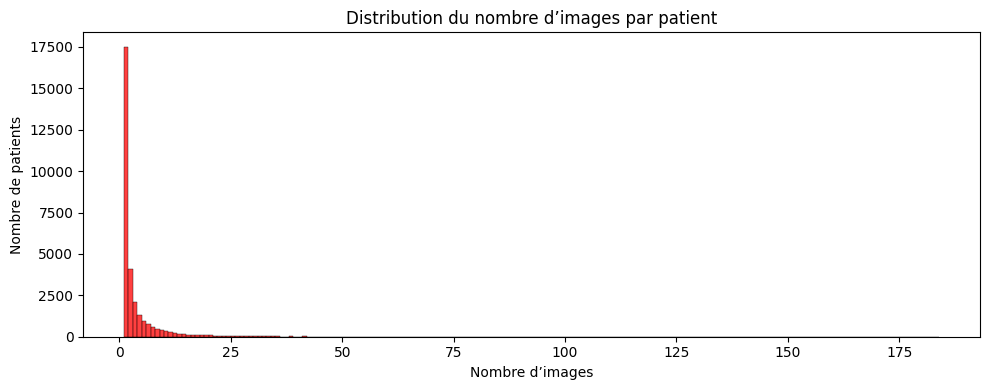

In [14]:
# 📊 Nombre d’images par patient
images_per_patient = data['Patient ID'].value_counts()

# 🔢 Statistiques descriptives
print("Images par patient :")
print(images_per_patient.describe())

# 📈 Histogramme
plt.figure(figsize=(10, 4))
sns.histplot(images_per_patient, bins=range(1, images_per_patient.max()+1), color='red', kde=False)
plt.title("Distribution du nombre d’images par patient")
plt.xlabel("Nombre d’images")
plt.ylabel("Nombre de patients")
plt.tight_layout()
plt.show()


## Nombre d’images par patient

L’histogramme ci-dessus représente la distribution du nombre d’images disponibles pour chaque patient.

---

### Statistiques clés :

- **Total de patients analysés** : 30 805
- **Médiane** : 1 image par patient
- **Moyenne** : 3.6 images par patient
- **Maximum** : 184 images pour un seul patient
- **Écart-type** : 7.27 → distribution très étalée

---

### Observations principales :

- La **majorité des patients (plus de 50 %) n’ont qu’une seule image**.
- La distribution est **fortement déséquilibrée** : une minorité de patients ont **un grand nombre d’images** (jusqu’à 184).
- Ce type de distribution en **longue traîne** est typique des bases hospitalières, où certains patients reviennent régulièrement pour des examens de suivi.

---


Dans la suite, nous allons explorer la **position radiologique (PA vs AP)**, un facteur crucial pour la qualité d'interprétation des images.


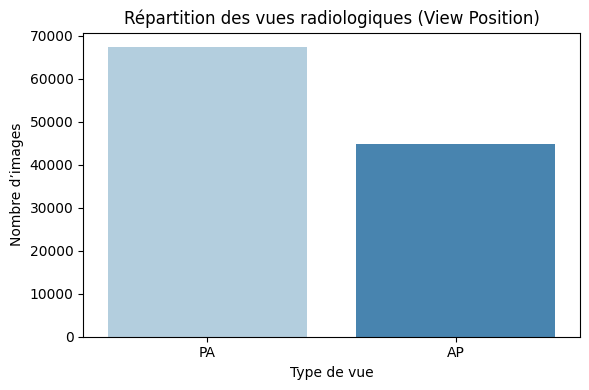

Proportions des types de vues :
 View Position
PA    60.03
AP    39.97
Name: count, dtype: float64


In [15]:
# Fréquence des positions radiologiques
view_counts = data['View Position'].value_counts()

# Barplot
plt.figure(figsize=(6, 4))
sns.barplot(x=view_counts.index, y=view_counts.values, palette="Blues")
plt.title("Répartition des vues radiologiques (View Position)")
plt.xlabel("Type de vue")
plt.ylabel("Nombre d’images")
plt.tight_layout()
plt.show()

# Affichage des proportions
view_percent = (view_counts / len(data)) * 100
print("Proportions des types de vues :\n", view_percent.round(2))


## Répartition des types de vue radiologique : PA vs AP

Ce graphique montre la répartition des types de projection utilisés pour les radiographies thoraciques dans le dataset.

---

### Résultats :

- **60.0 % des images** sont en vue **PA (postéro-antérieure)**,
- **40.0 % des images** sont en vue **AP (antéro-postérieure)**.

---

### Interprétation médicale :

- **Vue PA** : prise debout, de dos → qualité diagnostique optimale  
  → Elle est utilisée chez les patients stables, en consultation ou au bloc radio.

- **Vue AP** : prise de face, souvent au lit → moins fiable  
  → Utilisée pour les patients hospitalisés, alités ou en réanimation.

Les vues **AP peuvent fausser l’interprétation de certaines pathologies**, comme :
- Cardiomegaly (peut paraître plus marquée),
- Infiltration ou Effusion (moins bien localisées).

---

### Implications pour l’analyse et la modélisation :

- Il est important de **prendre en compte le type de vue** dans les modèles :
  - soit en le traitant comme une **variable explicative**,
  - soit en **stratifiant les jeux de données** pour ne pas mélanger les contextes cliniques.

- Les **vues PA sont préférables pour l’évaluation de performance**, car elles sont plus standardisées.

---

Nous allons maintenant examiner la **répartition des images “normales” (No Finding)** dans le dataset.


In [33]:
%config Completer.use_jedi = False

In [ ]:
nb_no_fining = data['No Finding']

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


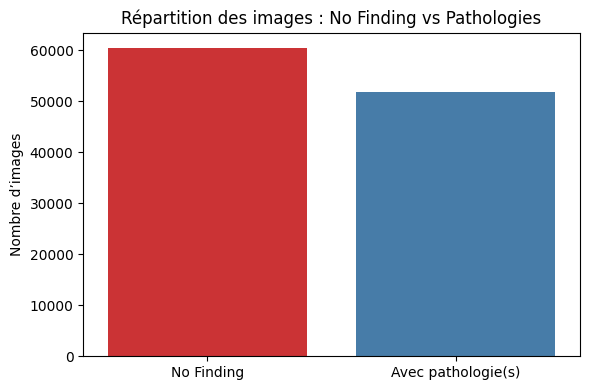

 53.84% des images sont annotées comme 'No Finding'


In [16]:
# On compte le nombre d’images avec "No Finding"
nb_no_finding = data['No Finding'].sum()
nb_total = len(data)
nb_with_patho = nb_total - nb_no_finding

# Barplot
plt.figure(figsize=(6, 4))
sns.barplot(x=["No Finding", "Avec pathologie(s)"], y=[nb_no_finding, nb_with_patho], palette="Set1")
plt.title("Répartition des images : No Finding vs Pathologies")
plt.ylabel("Nombre d’images")
plt.tight_layout()
plt.show()

# Affichage des proportions
no_finding_pct = (nb_no_finding / nb_total) * 100
print(f" {no_finding_pct:.2f}% des images sont annotées comme 'No Finding'")


Le graphique ci-dessus montre que :

- **53.84 % des images** sont annotées comme **"No Finding"**
- **46.16 %** présentent au moins une pathologie détectée.


Le label `"No Finding"` **ne signifie pas** forcément qu’il n’y a **aucune anomalie réelle**. Il indique simplement que :
- **aucune pathologie n’a été annotée** sur cette image,
- au moment de l’interprétation, **rien de visible n’a été signalé** par le radiologue.

Cela peut être dû à :
- il n'y a **pas d'anomalie**,
- une **anomalie trop subtile pour être détectée**,
- un **manque d’annotation**,
- une **lecture incomplète** ou centrée sur un autre objectif clinique.

---

Les modèles risquent d’**apprendre à détecter “No Finding” comme l’absence de toute anomalie**, alors que certaines anomalies **peuvent être présentes mais non annotées**.


---

Dans la suite, nous allons finaliser la préparation des données pour la modélisation multi-label.


## 6. Exploration visuelle des radiographies et qualité des images

Avant d’entraîner un modèle de classification ou détection, il est essentiel d’examiner quelques images pour :

- Vérifier la **qualité visuelle** des radiographies (contraste, résolution, présence d’artefacts),
- Identifier des **cas typiques ou atypiques** pour chaque pathologie,
- Comprendre la **variabilité des dimensions d’image** (utile pour standardiser les entrées d’un réseau de neurones),
- Repérer les **classes très peu représentées**, qui nécessiteront un **traitement particulier (ex : sur-échantillonnage, augmentation)**.

Nous allons commencer par visualiser quelques images étiquetées pour différentes pathologies.


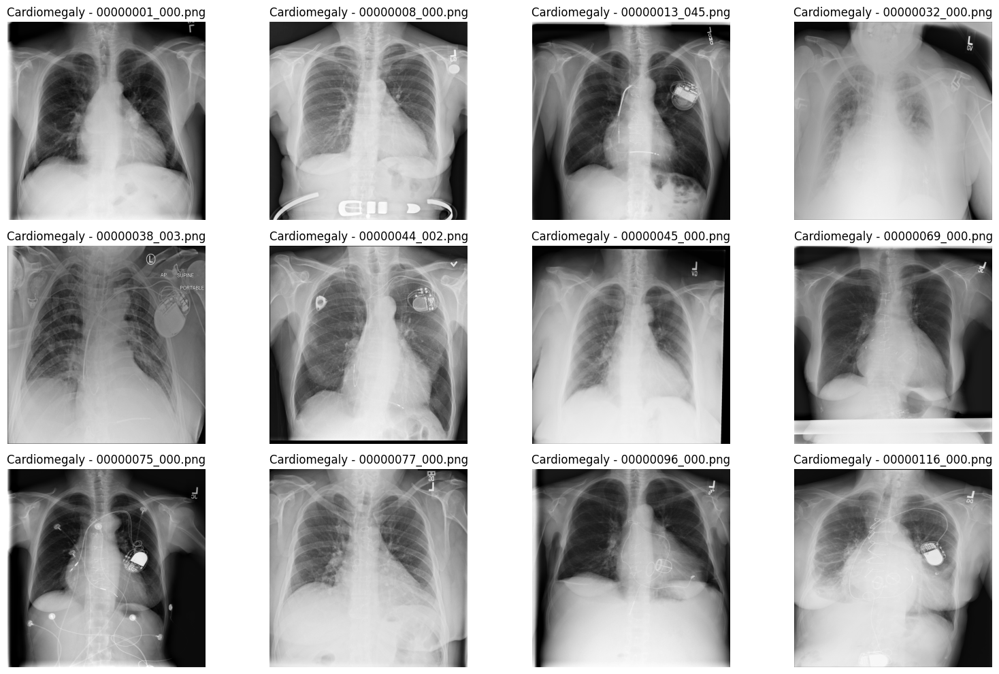

In [17]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import glob

# Choisir une pathologie
pathologie_cible = "Cardiomegaly"
base_dir = "/kaggle/input/data"

# Filtrer les images avec une seule pathologie (hors No Finding)
df_filtered = data[
    (data[pathologie_cible] == 1) & 
    (data['Num Pathologies'] == 1)
]

# Garder un seul échantillon par patient
df_unique_patients = df_filtered.drop_duplicates(subset='Patient ID').head(12)

#Liste des images
images_patho = df_unique_patients['Image Index'].tolist()

# Affichage
plt.figure(figsize=(16, 10))

for i, img_name in enumerate(images_patho):
    pattern = os.path.join(base_dir, "images_*", "images", img_name)
    found = glob.glob(pattern)

    if found:
        img = mpimg.imread(found[0])
        plt.subplot(3, 4, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{pathologie_cible} - {img_name}")
        plt.axis('off')
    else:
        print(f"Image non trouvée : {img_name}")

plt.tight_layout()
plt.show()


Voici quelques exemples de radiographies thoraciques annotées avec la pathologie **Cardiomegaly** (cardiomégalie).


### Observations :

- On observe une **augmentation du volume cardiaque** visible sur la plupart des images (silhouette cardiaque élargie).
- La **qualité des images est globalement bonne**, avec des contrastes satisfaisants et des structures thoraciques nettes.
- On note une certaine **variabilité** dans :
  - l’orientation (AP vs PA),
  - la présence de dispositifs médicaux (ex. : pacemaker visible sur certaines images),
  - la luminosité et le niveau de gris.

---

### Importance pour la modélisation :

- Cette variabilité souligne le besoin de **prétraitements homogénéisants** avant d'entraîner un modèle :
  - redimensionnement,
  - normalisation des contrastes,
  - Peut être, augmentation de données.

- Ces images confirment que le dataset contient des **signaux visuels exploitables**.



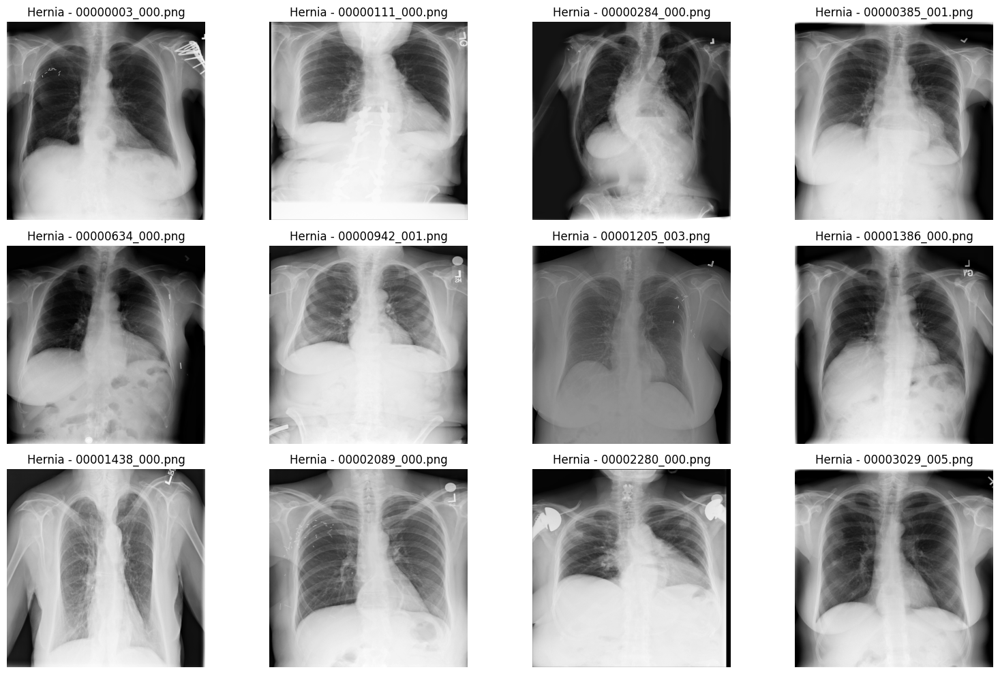

In [18]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import glob

# Choisir une pathologie
pathologie_cible = "Hernia"
base_dir = "/kaggle/input/data"

# Filtrer les images avec une seule pathologie (hors No Finding)
df_filtered = data[
    (data[pathologie_cible] == 1) & 
    (data['Num Pathologies'] == 1)
]

# Garder un seul échantillon par patient
df_unique_patients = df_filtered.drop_duplicates(subset='Patient ID').head(12)

# Liste des images
images_patho = df_unique_patients['Image Index'].tolist()

# Affichage
plt.figure(figsize=(16, 10))

for i, img_name in enumerate(images_patho):
    pattern = os.path.join(base_dir, "images_*", "images", img_name)
    found = glob.glob(pattern)

    if found:
        img = mpimg.imread(found[0])
        plt.subplot(3, 4, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{pathologie_cible} - {img_name}")
        plt.axis('off')
    else:
        print(f"Image non trouvée : {img_name}")

plt.tight_layout()
plt.show()




La hernie diaphragmatique est une pathologie rare dans le dataset.

#### Observations :
- Présence d’air ou d’opacités en bas du thorax (souvent côté gauche),
- Diaphragme déformé ou surélevé sur certains clichés,
- Déplacement possible des structures thoraciques.

#### Remarques :
- Les signes sont souvent discrets, rendant la détection difficile,
- Forte variabilité des images (qualité, contraste, position),
- Pathologie rare → nécessitera augmentation de données ou pondération en apprentissage.



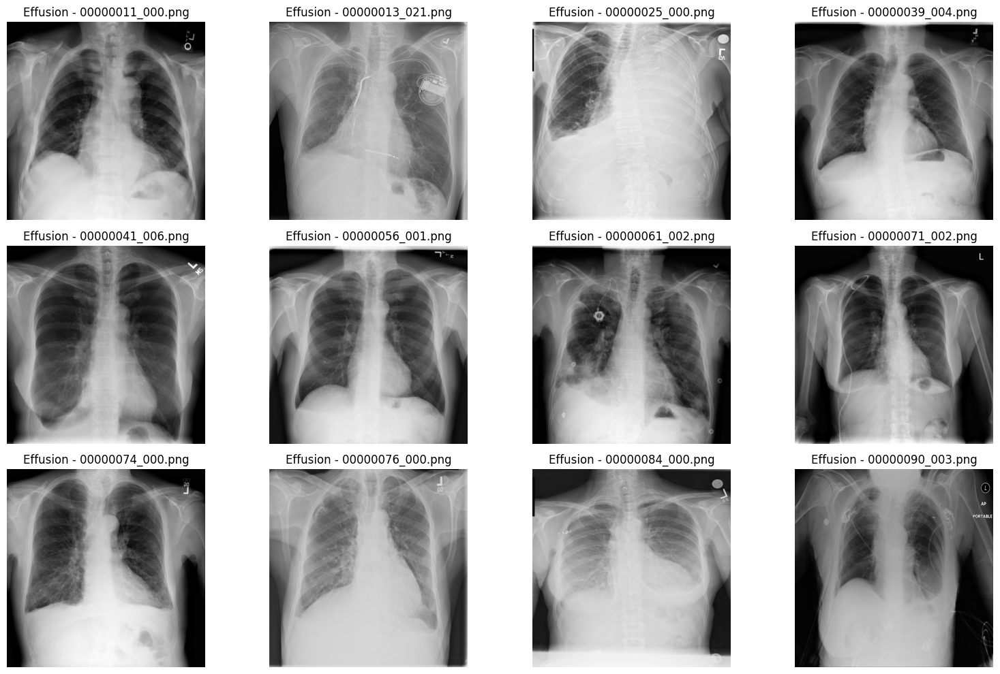

In [19]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import glob

# Choisir une pathologie
pathologie_cible = "Effusion"
base_dir = "/kaggle/input/data"

#  Filtrer les images avec une seule pathologie (hors No Finding)
df_filtered = data[
    (data[pathologie_cible] == 1) & 
    (data['Num Pathologies'] == 1)
]

# Garder un seul échantillon par patient
df_unique_patients = df_filtered.drop_duplicates(subset='Patient ID').head(12)

# Liste des images
images_patho = df_unique_patients['Image Index'].tolist()

# Affichage
plt.figure(figsize=(16, 10))

for i, img_name in enumerate(images_patho):
    pattern = os.path.join(base_dir, "images_*", "images", img_name)
    found = glob.glob(pattern)

    if found:
        img = mpimg.imread(found[0])
        plt.subplot(3, 4, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{pathologie_cible} - {img_name}")
        plt.axis('off')
    else:
        print(f"Image non trouvée : {img_name}")

plt.tight_layout()
plt.show()


L’effusion pleurale correspond à un épanchement de liquide dans l’espace pleural.

#### Observations :
- Opacités homogènes dans les bases pulmonaires,
- Bords costophréniques effacés (angle entre côtes et diaphragme non visible),
- Déplacement éventuel du médiastin sur les gros épanchements.

#### Remarques :
- Les signes sont bien visibles sur plusieurs images (opacité basale nette),
- Variabilité des positions (PA vs AP), ce qui peut influencer la lisibilité,
- Pathologie fréquente → bon candidat pour l’entraînement de modèles.



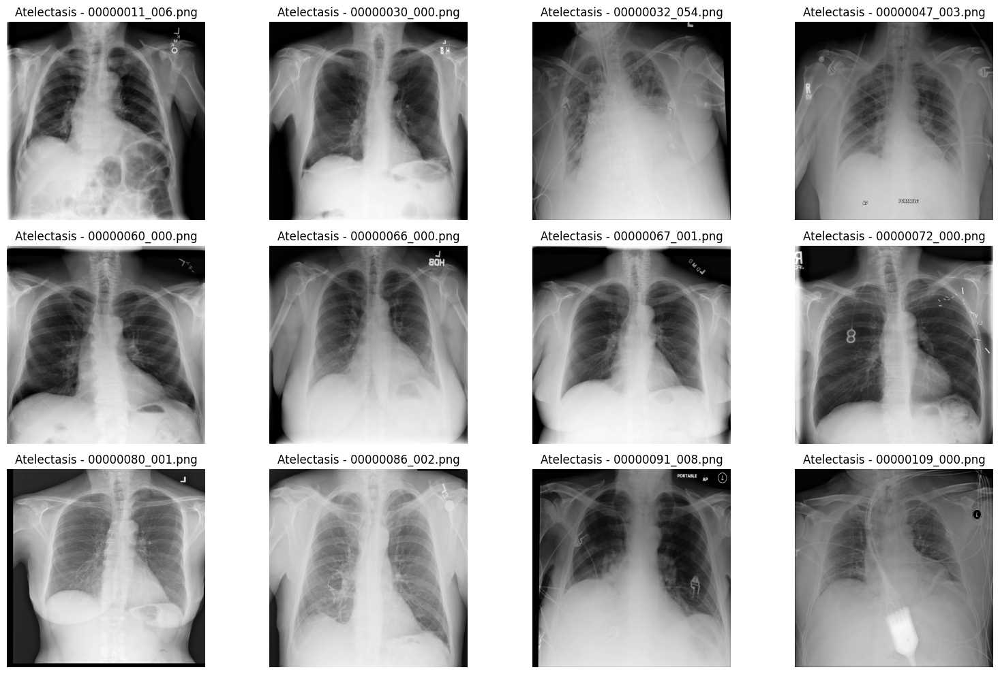

In [20]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import glob

# Choisir une pathologie
pathologie_cible = "Atelectasis"
base_dir = "/kaggle/input/data"

# Filtrer les images avec une seule pathologie (hors No Finding)
df_filtered = data[
    (data[pathologie_cible] == 1) & 
    (data['Num Pathologies'] == 1)
]

# Garder un seul échantillon par patient
df_unique_patients = df_filtered.drop_duplicates(subset='Patient ID').head(12)

# Liste des images
images_patho = df_unique_patients['Image Index'].tolist()

#* Affichage
plt.figure(figsize=(16, 10))

for i, img_name in enumerate(images_patho):
    pattern = os.path.join(base_dir, "images_*", "images", img_name)
    found = glob.glob(pattern)

    if found:
        img = mpimg.imread(found[0])
        plt.subplot(3, 4, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{pathologie_cible} - {img_name}")
        plt.axis('off')
    else:
        print(f"Image non trouvée : {img_name}")

plt.tight_layout()
plt.show()

L’atélectasie correspond à un affaissement partiel ou complet du poumon.

#### Observations :
- Zones opaques mal ventilées (souvent unilatérales),
- Déviation de la trachée ou des structures médiastinales,
- Réduction du volume pulmonaire apparent.

#### Remarques :
- Les signes sont parfois subtils, difficiles à discerner sans expertise,
- Forte hétérogénéité des clichés : certaines images très claires, d'autres peu informatives,
- Modèle devra apprendre à détecter des indices parfois légers.



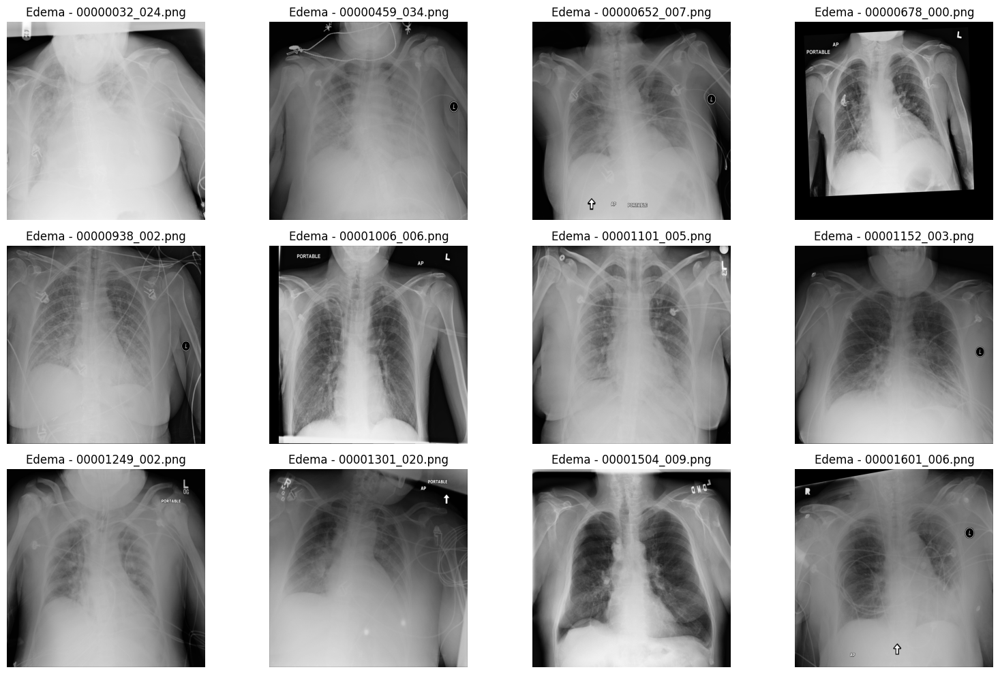

In [21]:
import matplotlib.image as mpimg
import os
import glob

# Choisir une pathologie
pathologie_cible = "Edema"
base_dir = "/kaggle/input/data"

# Filtrer les images avec une seule pathologie (hors No Finding)
df_filtered = data[
    (data[pathologie_cible] == 1) & 
    (data['Num Pathologies'] == 1)
]

# Garder un seul échantillon par patient
df_unique_patients = df_filtered.drop_duplicates(subset='Patient ID').head(12)

# Liste des images
images_patho = df_unique_patients['Image Index'].tolist()

#* Affichage
plt.figure(figsize=(16, 10))

for i, img_name in enumerate(images_patho):
    pattern = os.path.join(base_dir, "images_*", "images", img_name)
    found = glob.glob(pattern)

    if found:
        img = mpimg.imread(found[0])
        plt.subplot(3, 4, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{pathologie_cible} - {img_name}")
        plt.axis('off')
    else:
        print(f"Image non trouvée : {img_name}")

plt.tight_layout()
plt.show()

L’œdème pulmonaire correspond à une accumulation anormale de liquide dans les alvéoles.

#### Observations :
- Présence fréquente d'opacités diffuses bilatérales (aspect "floconneux"),
- Augmentation de la densité autour des hiles pulmonaires,
- Images souvent associées à un matériel médical (intubation, cathéters).

#### Remarques :
- Les signes sont assez visibles dans plusieurs cas, ce qui est prometteur pour l'entraînement d’un modèle.
- On remarque aussi des variations importantes de contraste entre les images.



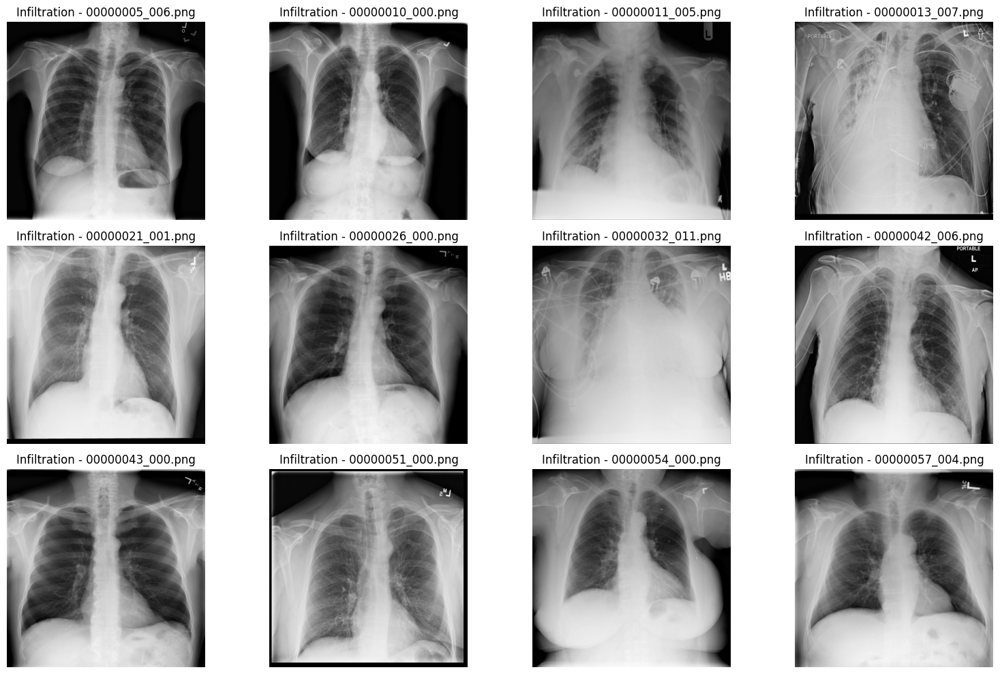

In [22]:
import matplotlib.image as mpimg
import os
import glob

# Choisir une pathologie
pathologie_cible = "Infiltration"
base_dir = "/kaggle/input/data"

# Filtrer les images avec une seule pathologie (hors No Finding)
df_filtered = data[
    (data[pathologie_cible] == 1) & 
    (data['Num Pathologies'] == 1)
]

# Garder un seul échantillon par patient
df_unique_patients = df_filtered.drop_duplicates(subset='Patient ID').head(12)

# Liste des images
images_patho = df_unique_patients['Image Index'].tolist()

#* Affichage
plt.figure(figsize=(16, 10))

for i, img_name in enumerate(images_patho):
    pattern = os.path.join(base_dir, "images_*", "images", img_name)
    found = glob.glob(pattern)

    if found:
        img = mpimg.imread(found[0])
        plt.subplot(3, 4, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{pathologie_cible} - {img_name}")
        plt.axis('off')
    else:
        print(f"Image non trouvée : {img_name}")

plt.tight_layout()
plt.show()

L'infiltration correspond à la présence de substances (liquide, cellules inflammatoires, etc.) dans les tissus pulmonaires.

#### Observations :
- Opacités diffuses ou localisées, souvent subtiles,
- Zones de flou dans les champs pulmonaires, parfois mal délimitées,
- Variabilité importante entre les cas, certains clichés étant à peine marqués.

#### Remarque :
Cette étiquette semble parfois sujette à interprétation, ce qui peut poser problème en modélisation automatique.


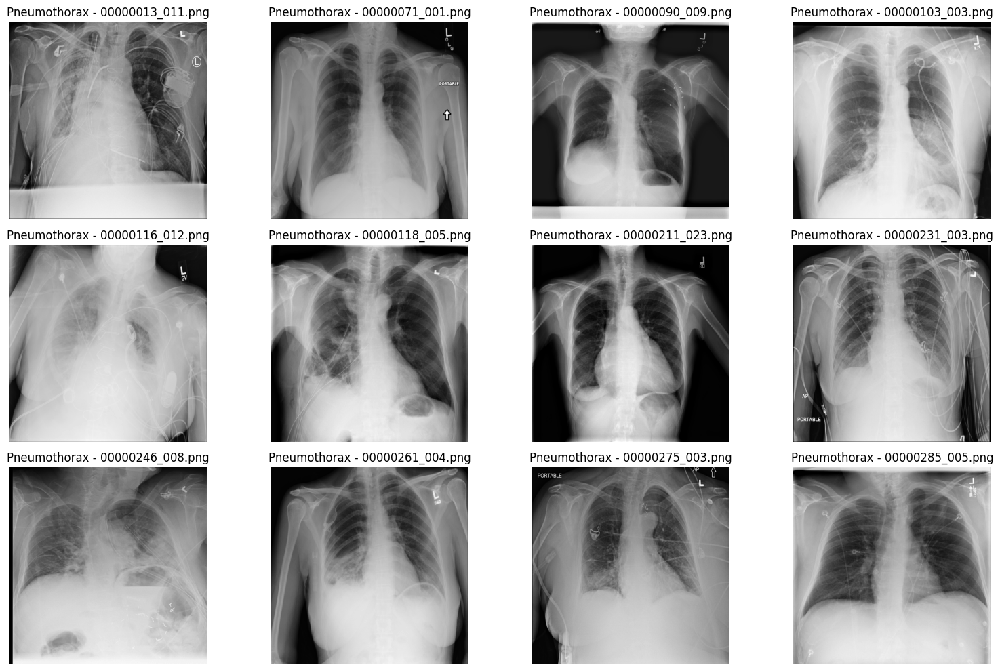

In [23]:
import matplotlib.image as mpimg
import os
import glob

# Choisir une pathologie
pathologie_cible = "Pneumothorax"
base_dir = "/kaggle/input/data"

# Filtrer les images avec une seule pathologie (hors No Finding)
df_filtered = data[
    (data[pathologie_cible] == 1) & 
    (data['Num Pathologies'] == 1)
]

# Garder un seul échantillon par patient
df_unique_patients = df_filtered.drop_duplicates(subset='Patient ID').head(12)

# Liste des images
images_patho = df_unique_patients['Image Index'].tolist()

#* Affichage
plt.figure(figsize=(16, 10))

for i, img_name in enumerate(images_patho):
    pattern = os.path.join(base_dir, "images_*", "images", img_name)
    found = glob.glob(pattern)

    if found:
        img = mpimg.imread(found[0])
        plt.subplot(3, 4, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{pathologie_cible} - {img_name}")
        plt.axis('off')
    else:
        print(f"Image non trouvée : {img_name}")

plt.tight_layout()
plt.show()

Le pneumothorax correspond à une accumulation d’air entre les feuillets de la plèvre, provoquant un affaissement partiel ou complet du poumon.

#### Observations :
- Présence fréquente de zones noires (air libre) sans trame pulmonaire visible,
- Déplacement du médiastin ou rétraction pulmonaire dans certains cas,
- Plusieurs clichés avec du matériel médical visible (drains, capteurs), fréquents en contexte d’urgence.

#### Remarque :
Les signes sont parfois discrets. Cette pathologie est cruciale à détecter rapidement en pratique clinique.


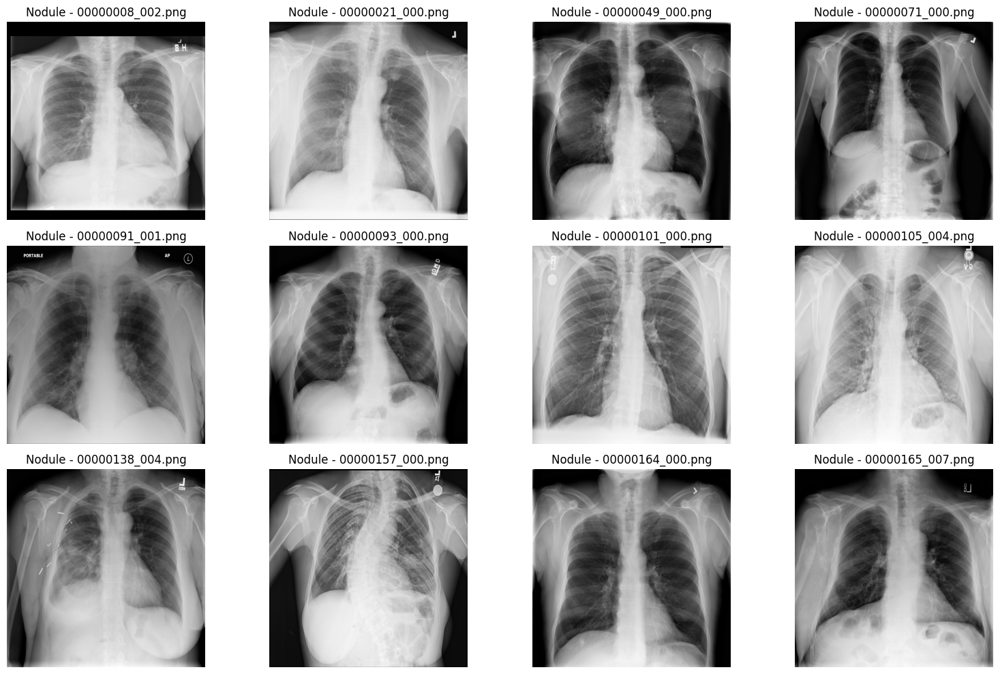

In [24]:
import matplotlib.image as mpimg
import os
import glob

# Choisir une pathologie
pathologie_cible = "Nodule"
base_dir = "/kaggle/input/data"

# Filtrer les images avec une seule pathologie (hors No Finding)
df_filtered = data[
    (data[pathologie_cible] == 1) & 
    (data['Num Pathologies'] == 1)
]

# Garder un seul échantillon par patient
df_unique_patients = df_filtered.drop_duplicates(subset='Patient ID').head(12)

# Liste des images
images_patho = df_unique_patients['Image Index'].tolist()

#* Affichage
plt.figure(figsize=(16, 10))

for i, img_name in enumerate(images_patho):
    pattern = os.path.join(base_dir, "images_*", "images", img_name)
    found = glob.glob(pattern)

    if found:
        img = mpimg.imread(found[0])
        plt.subplot(3, 4, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{pathologie_cible} - {img_name}")
        plt.axis('off')
    else:
        print(f"Image non trouvée : {img_name}")

plt.tight_layout()
plt.show()

Les nodules pulmonaires sont de petites opacités rondes ou ovales, souvent subtiles et localisées.

#### Observations :
- Les nodules apparaissent sous forme de taches blanches discrètes, parfois confondues avec les vaisseaux pulmonaires.
- Leur détection peut être difficile sans rehaussement ou annotation.
- La taille, la forme et les contours peuvent varier, rendant l’annotation incertaine en l’absence de repères clairs.

#### Remarques :
Les nodules sont un défi pour la modélisation car ils nécessitent une attention particulière au **détail local**, rendant utiles les méthodes à haute résolution ou de détection.


In [25]:
data

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,Image Width,Image Height,PixelSpacing X,...,Edema,Atelectasis,Hernia,Consolidation,Infiltration,Effusion,Emphysema,No Finding,Pneumothorax,Num Pathologies
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,...,0,0,0,0,0,0,0,0,0,1
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,...,0,0,0,0,0,0,1,0,0,2
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,...,0,0,0,0,0,1,0,0,0,2
3,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,...,0,0,0,0,0,0,0,1,0,0
4,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,...,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112115,00030801_001.png,Mass|Pneumonia,1,30801,39,M,PA,2048,2500,0.168,...,0,0,0,0,0,0,0,0,0,2
112116,00030802_000.png,No Finding,0,30802,29,M,PA,2048,2500,0.168,...,0,0,0,0,0,0,0,1,0,0
112117,00030803_000.png,No Finding,0,30803,42,F,PA,2048,2500,0.168,...,0,0,0,0,0,0,0,1,0,0
112118,00030804_000.png,No Finding,0,30804,30,F,PA,2048,2500,0.168,...,0,0,0,0,0,0,0,1,0,0


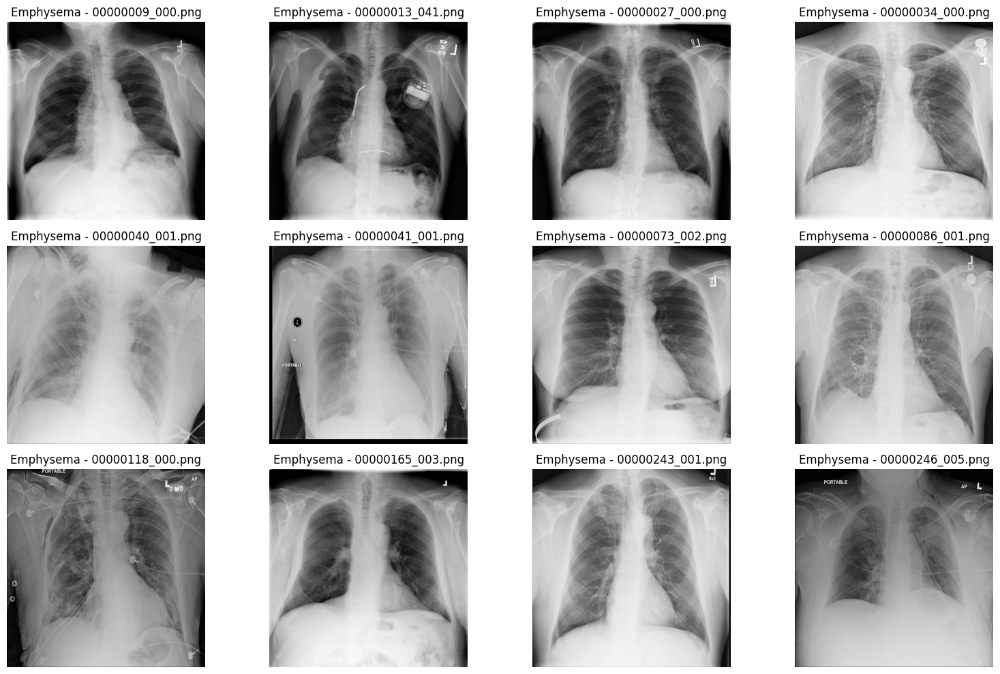

In [26]:
import matplotlib.image as mpimg
import os
import glob

# Choisir une pathologie
pathologie_cible = "Emphysema"
base_dir = "/kaggle/input/data"

# Filtrer les images avec une seule pathologie (hors No Finding)
df_filtered = data[
    (data[pathologie_cible] == 1) & 
    (data['Num Pathologies'] == 1)
]

# Garder un seul échantillon par patient
df_unique_patients = df_filtered.drop_duplicates(subset='Patient ID').head(12)

# Liste des images
images_patho = df_unique_patients['Image Index'].tolist()

#* Affichage
plt.figure(figsize=(16, 10))

for i, img_name in enumerate(images_patho):
    pattern = os.path.join(base_dir, "images_*", "images", img_name)
    found = glob.glob(pattern)

    if found:
        img = mpimg.imread(found[0])
        plt.subplot(3, 4, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{pathologie_cible} - {img_name}")
        plt.axis('off')
    else:
        print(f"Image non trouvée : {img_name}")

plt.tight_layout()
plt.show()

L’emphysème se manifeste par une hyperclarté pulmonaire et un aplatissement des diaphragmes, traduisant une distension anormale des alvéoles.

#### Observations :
- Certains clichés montrent une hyperclarté pulmonaire et un diaphragme aplati, signes typiques de l’emphysème.
- D’autres images présentent des poumons assez normaux visuellement, soulignant la subtilité possible de cette pathologie.

#### Remarques :
- Forte variabilité visuelle entre les cas.
- La pathologie peut être difficile à détecter à l'œil nu.
- Importance du prétraitement et d’un modèle sensible aux variations fines.


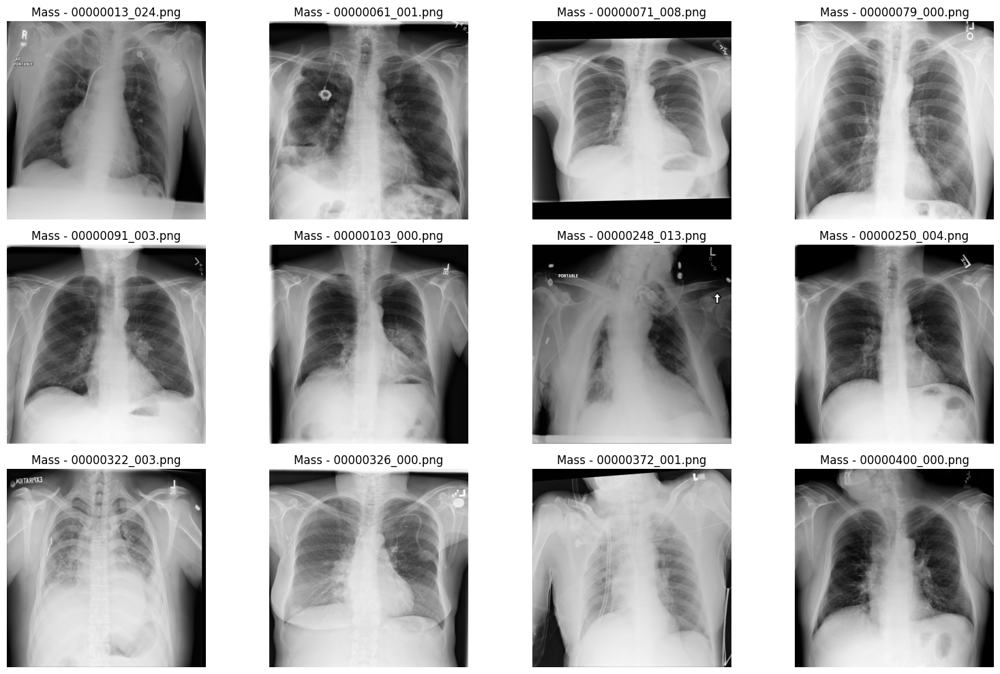

In [27]:
import matplotlib.image as mpimg
import os
import glob

# Choisir une pathologie
pathologie_cible = "Mass"
base_dir = "/kaggle/input/data"

# Filtrer les images avec une seule pathologie (hors No Finding)
df_filtered = data[
    (data[pathologie_cible] == 1) & 
    (data['Num Pathologies'] == 1)
]

# Garder un seul échantillon par patient
df_unique_patients = df_filtered.drop_duplicates(subset='Patient ID').head(12)

# Liste des images
images_patho = df_unique_patients['Image Index'].tolist()

#* Affichage
plt.figure(figsize=(16, 10))

for i, img_name in enumerate(images_patho):
    pattern = os.path.join(base_dir, "images_*", "images", img_name)
    found = glob.glob(pattern)

    if found:
        img = mpimg.imread(found[0])
        plt.subplot(3, 4, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{pathologie_cible} - {img_name}")
        plt.axis('off')
    else:
        print(f"Image non trouvée : {img_name}")

plt.tight_layout()
plt.show()

### Observations 

- Les masses pulmonaires se présentent comme des opacités bien définies, plus larges que les nodules.
- Certaines images montrent des bords nets, d'autres des contours plus flous ou irréguliers.
- Les masses sont visibles à différents endroits du champ pulmonaire (lobes supérieurs, inférieurs, médiastin).
- La taille des masses varie significativement d’un patient à l’autre.
- Ces images illustrent bien la **diversité de forme, taille et localisation** de cette pathologie, ce qui peut représenter un défi pour la détection automatique.



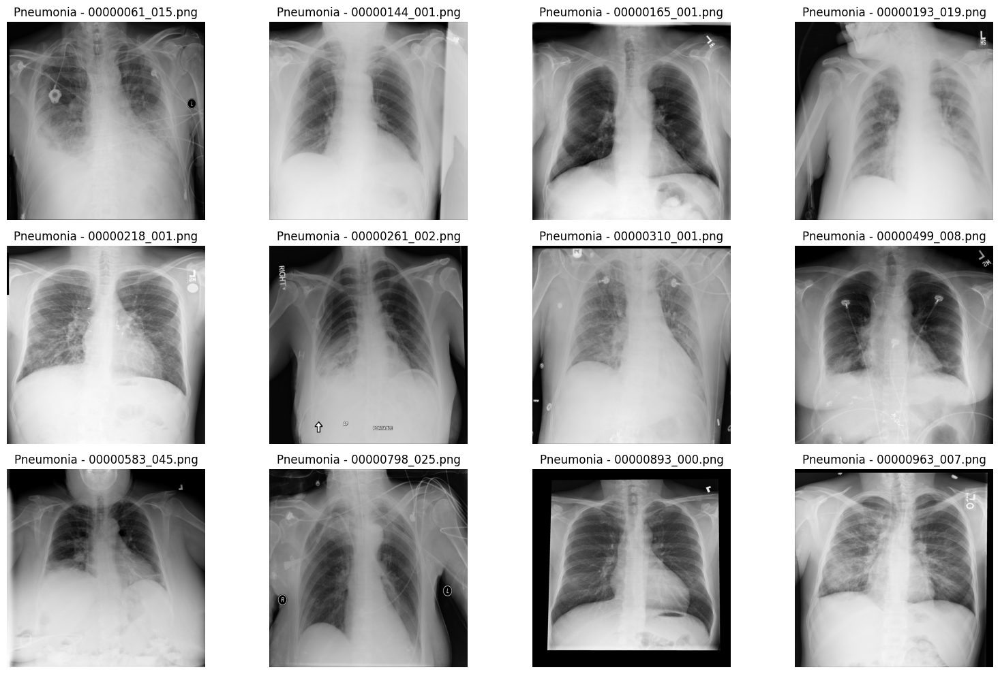

In [28]:
import matplotlib.image as mpimg
import os
import glob

# Choisir une pathologie
pathologie_cible = "Pneumonia"
base_dir = "/kaggle/input/data"

# Filtrer les images avec une seule pathologie (hors No Finding)
df_filtered = data[
    (data[pathologie_cible] == 1) & 
    (data['Num Pathologies'] == 1)
]

# Garder un seul échantillon par patient
df_unique_patients = df_filtered.drop_duplicates(subset='Patient ID').head(12)

# Liste des images
images_patho = df_unique_patients['Image Index'].tolist()

#* Affichage
plt.figure(figsize=(16, 10))

for i, img_name in enumerate(images_patho):
    pattern = os.path.join(base_dir, "images_*", "images", img_name)
    found = glob.glob(pattern)

    if found:
        img = mpimg.imread(found[0])
        plt.subplot(3, 4, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{pathologie_cible} - {img_name}")
        plt.axis('off')
    else:
        print(f"Image non trouvée : {img_name}")

plt.tight_layout()
plt.show()

### Observations

- La pneumonie apparaît sous forme de zones opaques diffuses dans un ou plusieurs lobes pulmonaires.
- Ces opacités sont souvent floues, irrégulières, et peuvent être localisées ou étendues.
- Sur plusieurs images, on remarque un effacement des contours des structures normales (côtes, diaphragme).
- Les présentations varient fortement selon les patients, rendant la détection parfois difficile sans expertise.


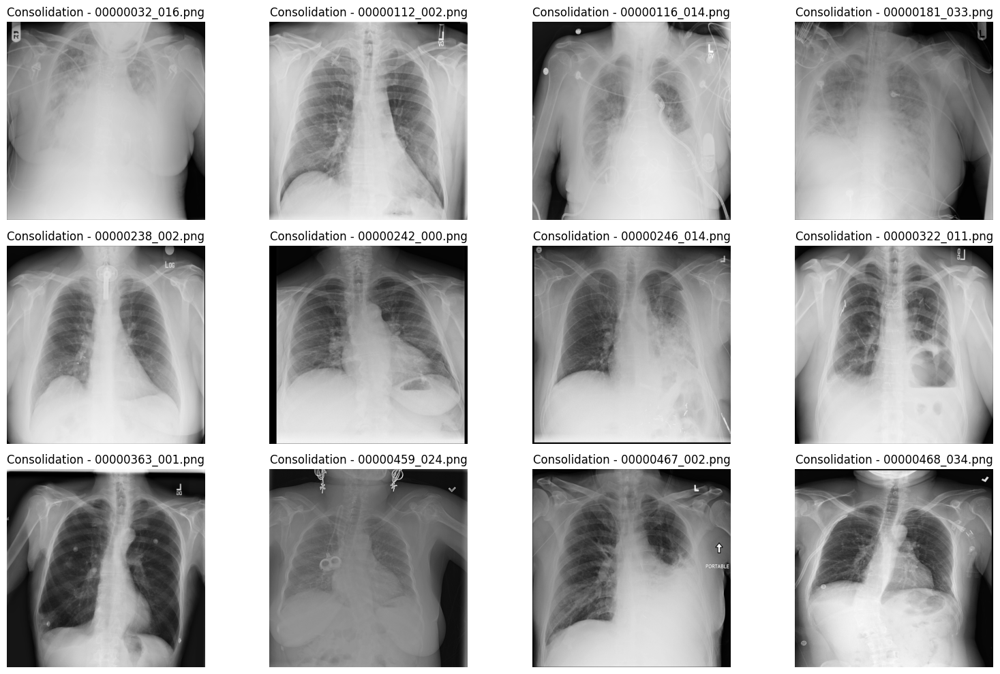

In [29]:
import matplotlib.image as mpimg
import os
import glob

# Choisir une pathologie
pathologie_cible = "Consolidation"
base_dir = "/kaggle/input/data"

# Filtrer les images avec une seule pathologie (hors No Finding)
df_filtered = data[
    (data[pathologie_cible] == 1) & 
    (data['Num Pathologies'] == 1)
]

# Garder un seul échantillon par patient
df_unique_patients = df_filtered.drop_duplicates(subset='Patient ID').head(12)

# Liste des images
images_patho = df_unique_patients['Image Index'].tolist()

#* Affichage
plt.figure(figsize=(16, 10))

for i, img_name in enumerate(images_patho):
    pattern = os.path.join(base_dir, "images_*", "images", img_name)
    found = glob.glob(pattern)

    if found:
        img = mpimg.imread(found[0])
        plt.subplot(3, 4, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{pathologie_cible} - {img_name}")
        plt.axis('off')
    else:
        print(f"Image non trouvée : {img_name}")

plt.tight_layout()
plt.show()


### Observations 

- Les consolidations apparaissent comme des zones opaques blanches bien visibles dans les poumons.
- Elles ont souvent des contours flous et peuvent occuper une grande partie d’un lobe.
- Contrairement à d'autres pathologies, l’intensité de l’opacité est souvent plus marquée et plus homogène.
- Cela peut refléter une infection, un œdème ou du liquide alvéolaire dense.



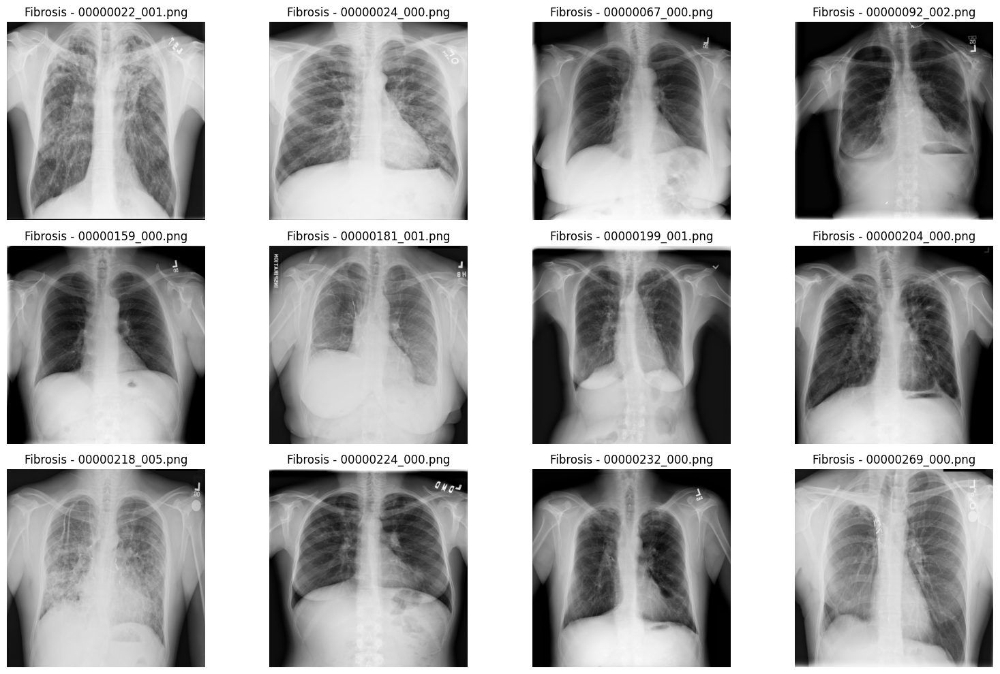

In [30]:
import matplotlib.image as mpimg
import os
import glob

# Choisir une pathologie
pathologie_cible = "Fibrosis"
base_dir = "/kaggle/input/data"

# Filtrer les images avec une seule pathologie (hors No Finding)
df_filtered = data[
    (data[pathologie_cible] == 1) & 
    (data['Num Pathologies'] == 1)
]

# Garder un seul échantillon par patient
df_unique_patients = df_filtered.drop_duplicates(subset='Patient ID').head(12)

# Liste des images
images_patho = df_unique_patients['Image Index'].tolist()

#* Affichage
plt.figure(figsize=(16, 10))

for i, img_name in enumerate(images_patho):
    pattern = os.path.join(base_dir, "images_*", "images", img_name)
    found = glob.glob(pattern)

    if found:
        img = mpimg.imread(found[0])
        plt.subplot(3, 4, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{pathologie_cible} - {img_name}")
        plt.axis('off')
    else:
        print(f"Image non trouvée : {img_name}")

plt.tight_layout()
plt.show()

### Observations – Fibrosis

Les images montrent des poumons avec des motifs diffus ou irréguliers, souvent avec des zones rétractées ou épaissies, caractéristiques d’une fibrose pulmonaire. L'opacité peut être fine, parfois linéaire, et altère la structure pulmonaire normale.

 Remarques :
- La fibrose semble entraîner une perte de volume pulmonaire sur certaines radios.
- Les signes sont plus discrets que pour des pathologies comme l’œdème ou la pneumonie, ce qui souligne la complexité de détection automatique.


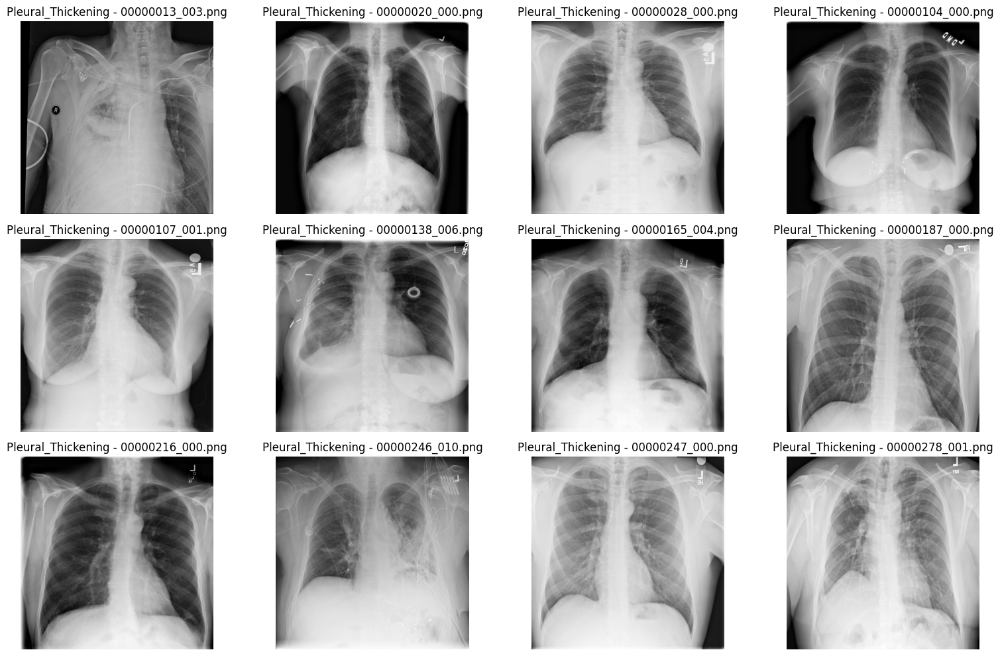

In [31]:
import matplotlib.image as mpimg
import os
import glob

# Choisir une pathologie
pathologie_cible = "Pleural_Thickening"
base_dir = "/kaggle/input/data"

# Filtrer les images avec une seule pathologie (hors No Finding)
df_filtered = data[
    (data[pathologie_cible] == 1) & 
    (data['Num Pathologies'] == 1)
]

# Garder un seul échantillon par patient
df_unique_patients = df_filtered.drop_duplicates(subset='Patient ID').head(12)

# Liste des images
images_patho = df_unique_patients['Image Index'].tolist()

#* Affichage
plt.figure(figsize=(16, 10))

for i, img_name in enumerate(images_patho):
    pattern = os.path.join(base_dir, "images_*", "images", img_name)
    found = glob.glob(pattern)

    if found:
        img = mpimg.imread(found[0])
        plt.subplot(3, 4, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{pathologie_cible} - {img_name}")
        plt.axis('off')
    else:
        print(f"Image non trouvée : {img_name}")

plt.tight_layout()
plt.show()

### Observations 
Les radiographies montrent un épaississement localisé de la plèvre, souvent visible près des bords latéraux des poumons. Ce signe peut être discret, apparaissant comme une ligne blanche plus dense ou irrégulière.

 Remarques :
- L’épaississement pleural est parfois difficile à distinguer sans comparaison latérale.
- Ce type d’anomalie nécessite une attention particulière lors de l'entraînement du modèle car elle peut facilement passer inaperçue.
